In [246]:
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf
from scipy import signal
from IPython.display import Audio
from scipy.io import wavfile as wav
from collections import defaultdict
import scipy
import math
from scipy.signal import zpk2tf,freqz,sawtooth,square,impulse, tf2zpk

import warnings
warnings.filterwarnings('ignore')


In [247]:
def read_file(filename="uh.wav"):
    uh_wave = wav.read(filename)
    sound_wave = uh_wave[1]
    Fs = uh_wave[0]
    return sound_wave,Fs

In [248]:
sound_wave, Fs = read_file()

# **Q1**
pre-emphasis is equavilent to applying a high-pass filter to the sound source.

# H(z) = 1 - alpha/z = Y(z)/X(z)

y[n] = x[n] - alpha*x[n-1]

Pre-emphasis reduces the impact of both lip radiation and glottal shaping on the sound, resulting in a less human-like quality.

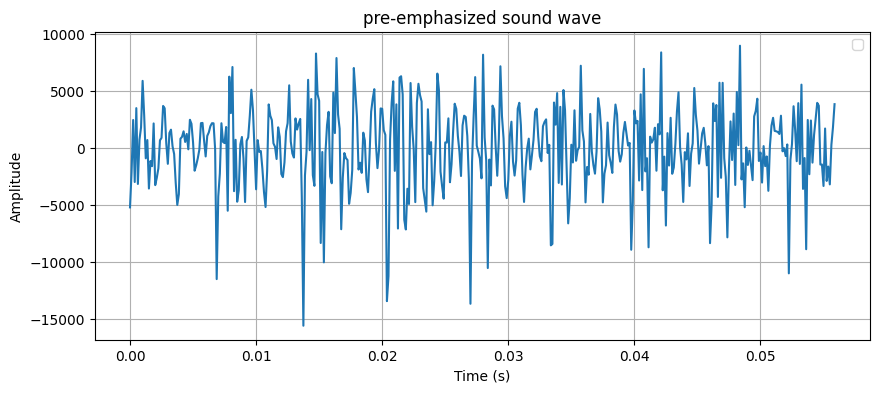

In [249]:
alpha = 0.95
out_pre_emp = np.zeros_like(sound_wave)
out_pre_emp[0] = sound_wave[0]
for i in range(1,len(sound_wave)):
    out_pre_emp[i] = sound_wave[i] - alpha*sound_wave[i-1]

duration = len(out_pre_emp) / float(Fs)  # Duration of the signal in second
t = np.linspace(0, duration, len(out_pre_emp), endpoint=False)

plt.figure(figsize=(10, 4))
plt.plot(t, out_pre_emp)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('pre-emphasized sound wave')
plt.legend()
plt.grid()
plt.show()


Audio(data = out_pre_emp , rate=Fs)

# **Q2**

sampling rate = 8000 hz
that is in 1s ~ 8000 samples,
           30ms ~ 240 samples



In the narrowband magnitude spectrum, we observe the formants that align with the formants of the vowel /a/. Due to pre-emphasis, the roll-off is gradual and lacks the sharpness found in the original sound spectrum.

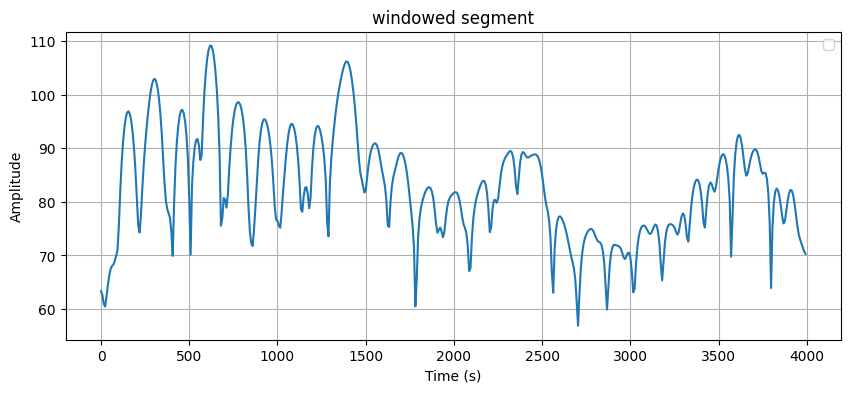

In [250]:
ham_window_duration = 240
center = len(sound_wave)//2
windowed_segment = sound_wave[len(sound_wave)//2- ham_window_duration//2 :len(sound_wave)//2 + ham_window_duration//2]
xticks = np.linspace(center-ham_window_duration//2,center+ ham_window_duration//2, ham_window_duration)

hamming_out = np.hamming(240)*windowed_segment


w,h_window = signal.freqz(hamming_out)
freq = Fs*w/(2*np.pi)
mag = 20 * np.log10(abs(h_window))

plt.figure(figsize=(10, 4))
plt.plot(freq, mag)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('windowed segment')
plt.legend()
plt.grid()
plt.show()


# **Q3**


As the value of 'p' increases, the energy of the error signal decreases, indicating that with higher 'p' values, our linear prediction (LP) analysis provides a more accurate approximation of the signal.

In [251]:
def auto_correlation(windowed_segment, p=2):
  N = len(windowed_segment)
  zeros = np.zeros(N * 2)
  zero_padded = zeros.copy()
  zero_padded[0:N] = windowed_segment
  r = []
  for i in range (0,p+1):
      shifted_segment = zeros.copy()
      shifted_segment[i:(N+i)] = windowed_segment
      segment_hat = np.sum(zero_padded*shifted_segment)
      r.append(round(segment_hat,3))
  return r

print("Autocorrelation coefficients for")
for p in [2,4,6,8,10]:
    print(f'p = {p}:', auto_correlation(windowed_segment, p))

Autocorrelation coefficients for
p = 2: [6512039001.0, 4485845271.0, 1599728789.0]
p = 4: [6512039001.0, 4485845271.0, 1599728789.0, -974810099.0, -1474769643.0]
p = 6: [6512039001.0, 4485845271.0, 1599728789.0, -974810099.0, -1474769643.0, -1382334214.0, -1408700326.0]
p = 8: [6512039001.0, 4485845271.0, 1599728789.0, -974810099.0, -1474769643.0, -1382334214.0, -1408700326.0, -2292715378.0, -3467132561.0]
p = 10: [6512039001.0, 4485845271.0, 1599728789.0, -974810099.0, -1474769643.0, -1382334214.0, -1408700326.0, -2292715378.0, -3467132561.0, -2498688697.0, -197442862.0]


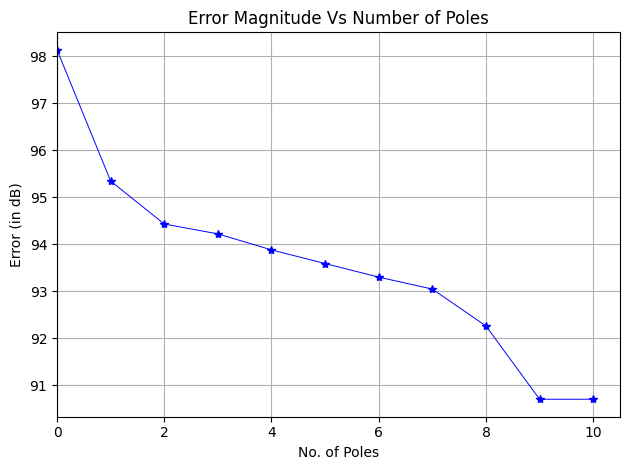

In [252]:
#Levinson-Durbin recursion to compute the LP coefficients from the autocorrelation coefficients


def LD_recu(sig,p):

  R = auto_correlation(sig,p)
  a = np.zeros((p+1,p+1))
  E = np.zeros(p+1)
  G = np.zeros(p+1)
  E[0] = R[0]
  for i in range (1, p+1):
    if i == 1:
      k1 = R[1]/E[0]
      a[1][0] = 1
      a[1][1] = k1
      E[1] = (1-k1**2)*E[0]
      G[1] = np.sqrt(E[1])
    else:
      summation = 0
      for j in range (1,i):
        summation += a[i-1][j] * R[i-j]

      k_i = (R[i] - summation)/E[i-1]
      a[i][i] = k_i

      for j in range(1,i):
        a[i][j] = a[i-1][j] - k_i * a[i-1][i-j]

      E[i] = (1 - (k_i)**2) * E[i-1]
      G[i] = np.sqrt(E[i])
      a[i][0] = 1



  x = [i for i in range(0,p+1)]

  plt.figure()
  plt.title(f'Error signal energy Vs Number of Poles')
  plt.plot(x ,10*np.log10(E),'b',linewidth=0.7, marker="*")
  plt.ylabel(r"Error (in dB)",fontsize=10)
  plt.xlabel(r"No. of Poles")
  plt.xlim(xmin=0)
  plt.grid("True")
  plt.tight_layout()
  plt.show()
  return(E, G, a)



E, G, a = LD_recu(windowed_segment, 10)


## **Q4**

In [253]:

def pole_zero_plot(a,windowed_segment,p):
  poles = [a[p][0]] + [-a[p][i] for i in range(1, p + 1)]
  gain = G[p]
  z,p,k = signal.tf2zpk(gain,poles)


  theta = np.linspace(0, 2 * np.pi, 100)
  x = np.cos(theta)
  y = np.sin(theta)
  plt.figure(figsize=(8, 8))
  plt.plot(x, y)

  plt.xlim(-1.2, 1.2)
  plt.ylim(-1.2, 1.2)
  plt.xlabel('Real')
  plt.ylabel('Imaginary')
  plt.grid("True")
  plt.tight_layout()

  plt.scatter(p.real, p.imag, marker='x')


# Display the plot.
  plt.show()


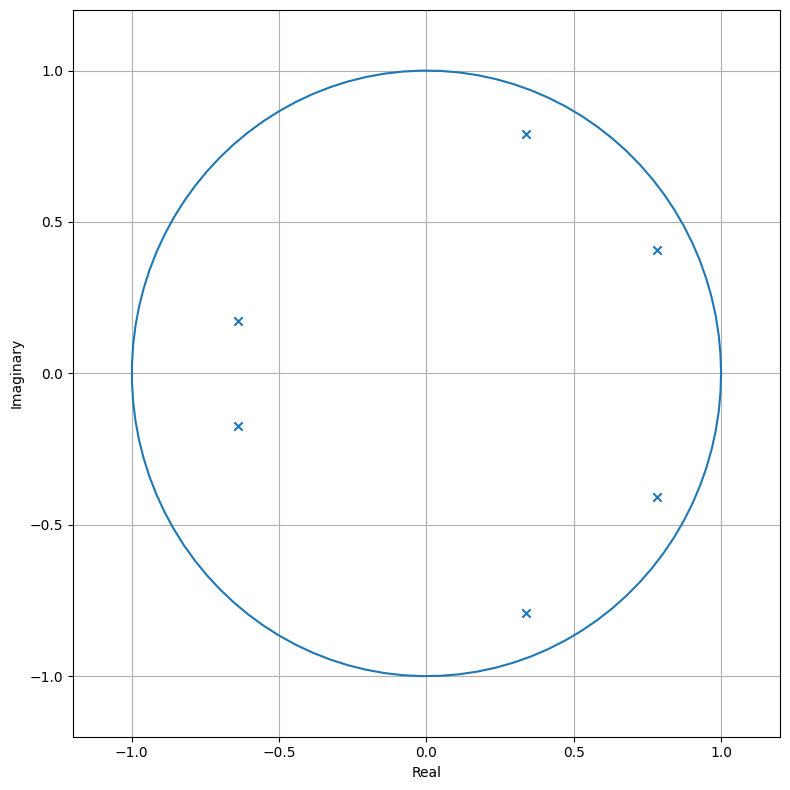

In [254]:
pole_zero_plot(a,windowed_segment, 6)

In the case of order 'p = 6,' we observe that there are six poles, which correspond to the determination of three formants. These formants' phase and magnitude characteristics can be leveraged to recompute the formant frequencies and their associated bandwidths. Here, the radius of the z-plane poles are less close to the unit-circle, and so these poles would have more bandwidth spread.

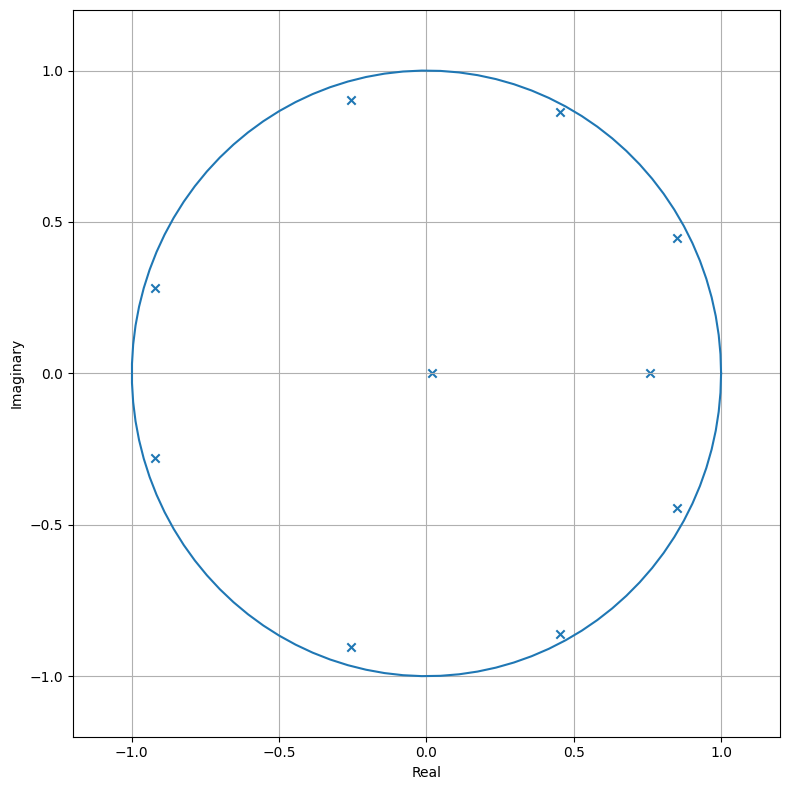

In [255]:
pole_zero_plot(a,windowed_segment, 10)

In the case of 'p = 10,' more poles are estimated. In the context of Time-Domain Linear Prediction Analysis (T.P. Analysis), it's evident that as the order 'p' increases, the number of poles and consequently the number of estimated formants also increase.In case of a 10th order filter, the poles are nearly coinciding on the unit circle, indicating that the corresponding bandwidths of the poles in the filter A(z) are estimated with a high level of precision.

*******

## **Q5**

In [256]:
def LPC(a,G,Fs,windowed_segment,p):
        poles = [a[p][0]] + [-a[p][i] for i in range(1, p + 1)]
        gain = G[p]
        w,h = signal.freqz(gain,poles)
        w_ham,h_ham = signal.freqz(windowed_segment)


        plt.plot((Fs*w/(2*np.pi)),20*np.log10(abs(h)),label="Estimated Spectrum")
        plt.plot((Fs*w_ham/(2*np.pi)),20*np.log10(abs(h_ham)),"r",alpha=0.5,label="Windowed Spectrum")
        plt.ylabel(r"LPC spectrum magnitude(in dB) ",fontsize=10)
        plt.xlabel(r"No. of Poles")
        plt.xlim(xmin=0)
        plt.grid("True")
        plt.tight_layout()
        plt.show()



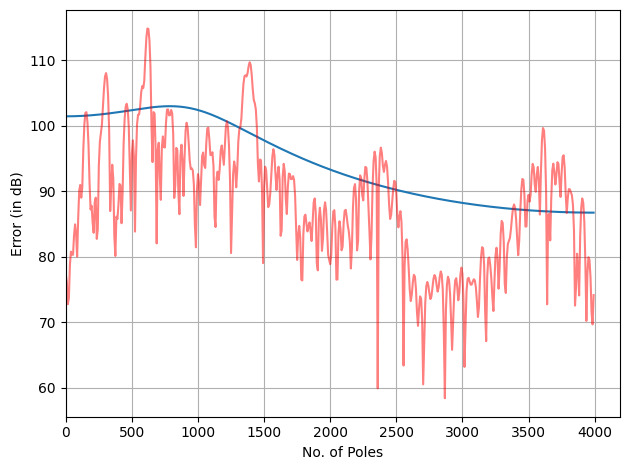

In [257]:
LPC(a,G,Fs,windowed_segment, p=2)

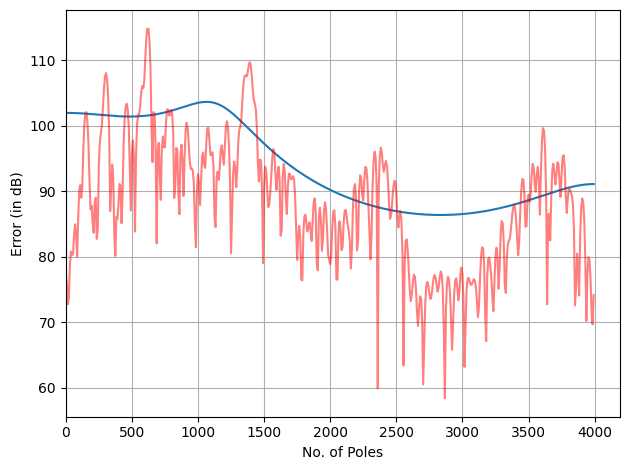

In [258]:
LPC(a,G,Fs,windowed_segment, p=4)

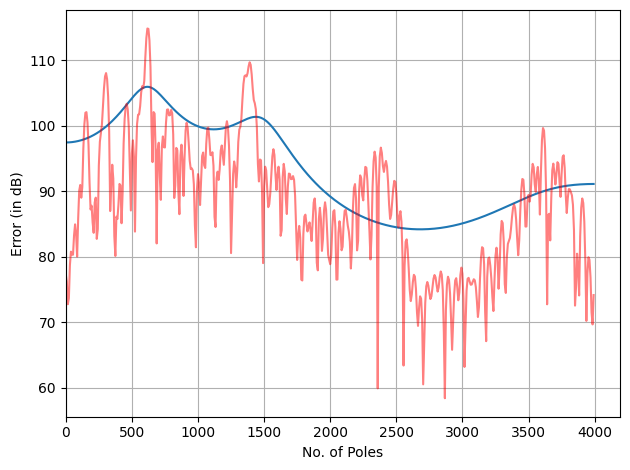

In [259]:
LPC(a,G,Fs,windowed_segment, p=6)

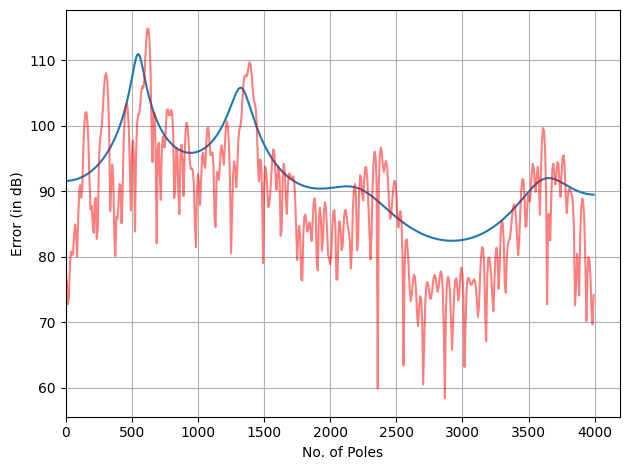

In [260]:
LPC(a,G,Fs,windowed_segment, p=8)

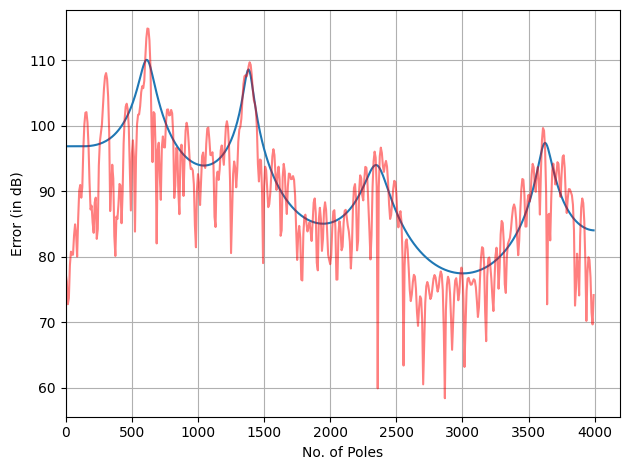

In [261]:
LPC(a,G,Fs,windowed_segment, p=10)

1. As 'p' increases, we observe
that the Linear Predictive Coding (LPC) spectrum increasingly resembles the magnitude spectrum.

2. When 'p' is set to 2 or 4, we only identify a single peak in the spectrum. With 'p' equal to 6, two peaks become apparent. When 'p' is set to 8 or 10, we are able to identify all four formants, corresponding to the four peaks in the spectrum. This indicates that our analysis provides a sufficiently accurate approximation of the spectral envelope (hidden envelope) of the speech signal.

3. As the value of 'p' increases, the gain of the system decreases.

*******

# **Q6**

In [262]:
def residual_sig(windowed_segment ,a , Fs, duration = 0.03):
  poles = [a[10][0]] + [-a[10][i] for i in range(1, 11)] #p=10
  window_dur = int(duration*Fs)

  inv_filter = np.zeros_like(windowed_segment)
  for k,val in enumerate(windowed_segment):
    if k > 10:
      inv_filter[k] = windowed_segment[k] - sum(np.array(poles) * np.flip(windowed_segment[k-11:k]))

  plt.figure(figsize = (10,4))
  plt.plot(np.arange(len(inv_filter))/8,inv_filter)
  plt.ylabel(r"residual error signal",fontsize=10)
  plt.xlabel(r"time")
  plt.xlim(xmin=0)
  plt.grid("True")
  plt.tight_layout()
  plt.show()

  return inv_filter


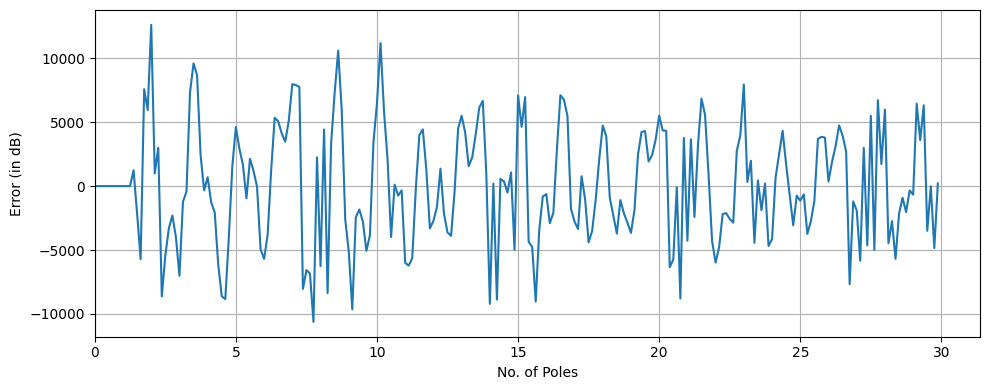

In [263]:
inv_filter = residual_sig(windowed_segment, a, Fs, duration=0.03)

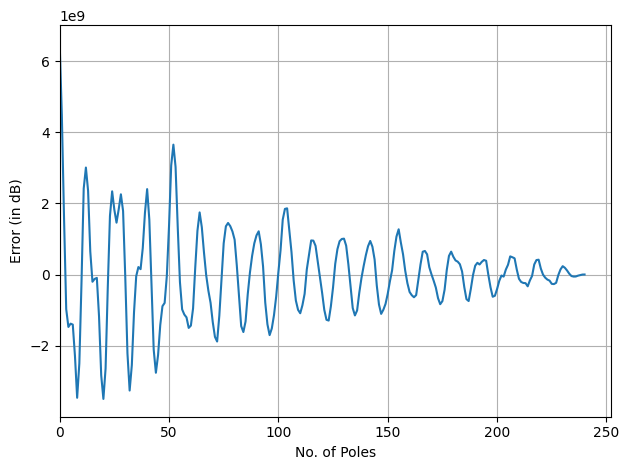

In [264]:
acf_orignal = auto_correlation(windowed_segment, p=240)

plt.figure()
plt.plot(acf_orignal)
plt.ylabel(r"Auto-correlation function of orignal signal",fontsize=10)
plt.xlabel(r"Time(ms)")
plt.xlim(xmin=0)
plt.grid("True")
plt.tight_layout()
plt.show()

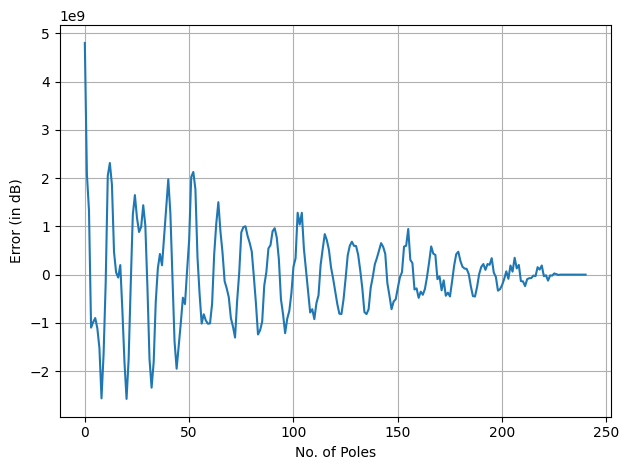

In [265]:
acf_residual = auto_correlation(inv_filter, p=240)

plt.figure()
plt.plot(acf_residual)
plt.ylabel(r"Auto-correlation function of residual error signal",fontsize=10)
plt.xlabel(r"Time(ms)")
plt.grid("True")
plt.tight_layout()
plt.show()

yes the pitch period can be determined by the residual waveform.

In [266]:
print(np.argmax(np.array(acf_orignal)[50:75]))
print(np.argmax(np.array(acf_residual)[50:75]))

print(acf_residual[51])

2
2
2022764249.0


In [267]:
sample_no = 51

def check_pitch(sample_no, num_checks = 10):
    for i in range(0,num_checks):
        if acf_orignal[sample_no] < acf_orignal[sample_no+i] or acf_orignal[sample_no] < acf_orignal[sample_no-i]:
            return False
    return True

print(check_pitch(50))
print(check_pitch(51))
print(check_pitch(52))
print(check_pitch(53))

False
False
True
False


In [268]:
sample_no = 12

def check_pitch2(sample_no, num_checks = 10):
    for i in range(0,num_checks):
        if acf_orignal[sample_no] < acf_orignal[sample_no+i] or acf_orignal[sample_no] < acf_orignal[sample_no-i]:
            return False
    return True

print(check_pitch2(10))
print(check_pitch2(11))
print(check_pitch2(12))
print(check_pitch2(13))

False
False
True
False


In [269]:
pitch_period = (52-12)/8000
f0 = (1/pitch_period)
print('pitch(F0) is:')
print(f0)

pitch(F0) is:
200.0



1. We have generated plots of the residual error signal and the Auto-Correlation Function (ACF) for the original speech segment and the residual error signal. The ACF reveals distinct peaks at regular intervals, such as 0, 52, 120, etc., all measured in 'samples.'
To precisely determine the pitch value, I've implemented a function called 'check_pitch,' which returns 'True' if the input value matches the exact pitch and 'False' otherwise. In this case, we've identified that the exact pitch corresponds to 12 samples for first peak and 52 samples for second peak, which translates to a time period of (52-12)/8000 seconds, equal to 5ms. This time period corresponds to a pitch of 200 Hz.

2. The Auto-Correlation plot of the Residual signal closely resembles that of the Original speech segment, with the key difference being that the residual signal exhibits lower magnitude compared to the original signal.

*****

# **Q7**

De-emphasis = 1/(1- alpha*z^-1)

y[n] = alpha*y[n-1] + x[n]


1. De-emphasis reintroduces the effects of lip radiation and glottal shaping, which were initially removed by pre-emphasis. The resulting sound is similar to the original, but not identical. It appears that certain formant information has been attenuated, as the pronunciation is not as distinctly /uh/ as before.

2. The reconstructed signal obtained by applying an impulse train with a frequency of F0 to a filter characterized by parameters (G, a) derived from the p-th order Linear Prediction (LP) Coefficients closely resembles the original signal.

3.
A valuable application of this reconstruction technique is in telecommunications, particularly in scenarios where conserving Bit Rate is crucial. By sending a smaller number of parameters compared to the full signal, this method contributes to efficient Bandwidth utilization and results in an enhanced Bit Rate.




In [270]:
from scipy.signal import zpk2tf,freqz,sawtooth,square,impulse, tf2zpk
def LP_resynthesis(f0, duration = 300, Fs=8000):
    period = f0/1000
    total = int(duration*Fs)
    t = np.linspace(0,duration,total)
    impulse_train = (signal.square(2 * np.pi *f0* t,duty=0.08)+1)/2

    plt.figure()
    plt.title("Source Impulse Train")
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.plot(t[:1000], impulse_train[:1000])
    plt.grid(color='0.9', linestyle='-')
    plt.autoscale(enable=True, axis='x', tight=True)

    return impulse_train, t

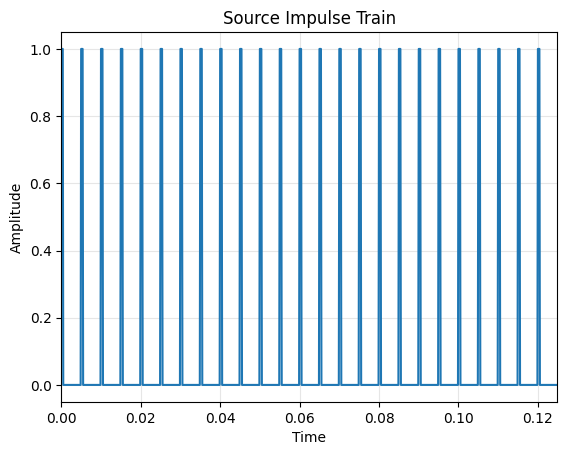

In [271]:
input, t = LP_resynthesis(f0, duration = 300, Fs=8000)

In [272]:
def deemp_signal(sound_wave,alpha):
  out_de_amp = np.zeros_like(sound_wave)
  out_de_amp[0] = sound_wave[0]

  for i in range(1, len(sound_wave)):
      out_de_amp[i] = alpha * out_de_amp[i-1] + sound_wave[i]
  return out_de_amp






In [273]:
def output(input, a, p, G, t):
     poles = [a[p][0]] + [-a[p][i] for i in range(1, p + 1)]
     gain = G[p]

     output_signal = np.zeros_like(input)
     for i in range(len(input)):
        output_signal[i] = gain*input[i]
        for j in range(len(poles)):
            if (i-j)>=0:
                output_signal[i] += poles[j]*input[i-j]


     output_deemphasized = deemp_signal(output_signal, 0.5)

     plt.figure()
     plt.title("Final Output Signal")
     plt.xlabel("Time")
     plt.ylabel("Amplitude")
     plt.plot(t,output_deemphasized)
     plt.grid(color='0.9', linestyle='-')
     plt.autoscale(enable=True, axis='x', tight=True)

     return output_deemphasized

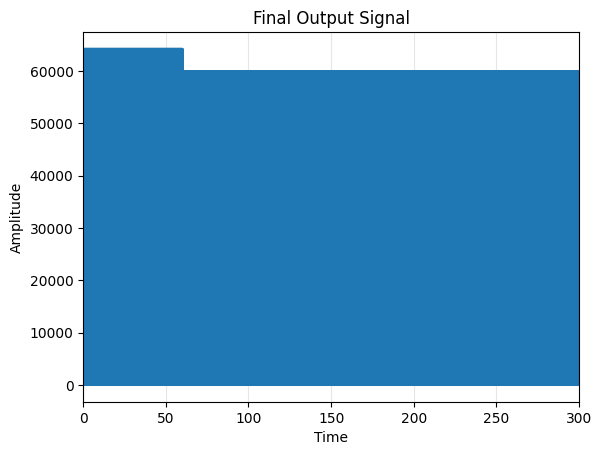

In [274]:
final_output_signal = output(input, a, 10, G, t)

In [275]:

Audio(data=final_output_signal, rate=Fs)

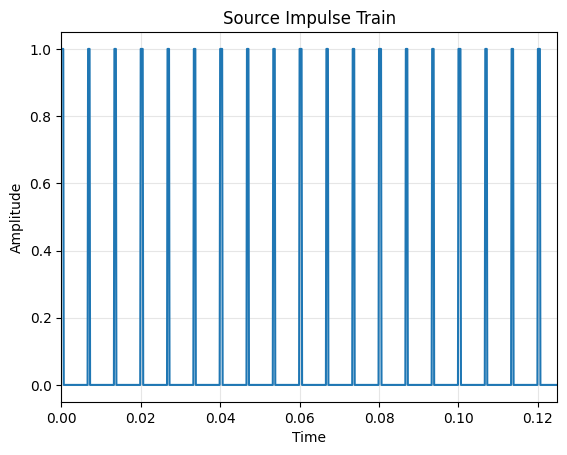

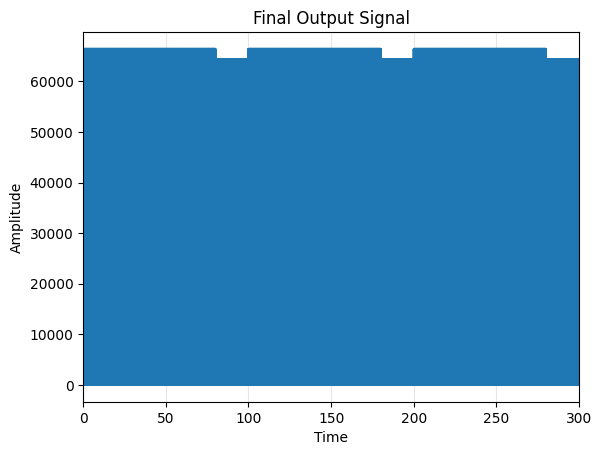

In [245]:
#For F0 = 150
input, t = LP_resynthesis(150, 300, Fs)
final_output_signal = output(input, a, 10, G, t)
Audio(data=final_output_signal, rate=Fs)